In [1]:
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
from sklearn import model_selection
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings("ignore")

In [2]:
#read in the data
ny = pd.read_csv('./statistically_significant_data.csv')

In [3]:
ny

,time_period,value,CASE_RATE,HOSPITALIZED_RATE,sentiment__negative,sentiment__positive,indicator
0,1.0,28.7,171.46,13.55,500.0,50.0,1.0
1,1.0,28.7,1554.45,153.69,500.0,50.0,1.0
2,1.0,28.7,2529.03,630.34,500.0,50.0,1.0
3,1.0,28.7,2552.64,1192.50,500.0,50.0,1.0
4,1.0,28.7,2976.74,1830.07,500.0,50.0,1.0
...,...,...,...,...,...,...,...
35779,23.0,35.8,20207.72,1160.60,501.0,49.0,2.0
35780,23.0,35.8,15941.19,2540.10,501.0,49.0,2.0
35781,23.0,35.8,7067.11,2418.35,501.0,49.0,2.0
35782,23.0,35.8,7477.43,3995.12,501.0,49.0,2.0


In [4]:
#ny["indicator"].replace({"Symptoms of Anxiety Disorder": "1", "Symptoms of Depressive Disorder": "2", "Symptoms of Anxiety Disorder or Depressive Disorder": "3"}, inplace=True)
#ny["age"].replace({"18 - 29 years": "29", "30 - 39 years": "39", "40 - 49 years": "49", "50 - 59 years":"59","60 - 69 years":"69","70 - 79 years":"79","80 years and above":"80"}, inplace=True)


In [5]:
data_to_use = ny
"""
del data_to_use['group']
del data_to_use['state']
del data_to_use['subgroup']
del data_to_use['time_period_label']
del data_to_use['confidence_interval']
del data_to_use['quartile_range']

ny = data_to_use"""
ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35784 entries, 0 to 35783
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   time_period          35784 non-null  float64
 1   value                35784 non-null  float64
 2   CASE_RATE            35784 non-null  float64
 3   HOSPITALIZED_RATE    35784 non-null  float64
 4   sentiment__negative  35784 non-null  float64
 5   sentiment__positive  35784 non-null  float64
 6   indicator            35784 non-null  float64
dtypes: float64(7)
memory usage: 1.9 MB


In [6]:
data_to_use

,time_period,value,CASE_RATE,HOSPITALIZED_RATE,sentiment__negative,sentiment__positive,indicator
0,1.0,28.7,171.46,13.55,500.0,50.0,1.0
1,1.0,28.7,1554.45,153.69,500.0,50.0,1.0
2,1.0,28.7,2529.03,630.34,500.0,50.0,1.0
3,1.0,28.7,2552.64,1192.50,500.0,50.0,1.0
4,1.0,28.7,2976.74,1830.07,500.0,50.0,1.0
...,...,...,...,...,...,...,...
35779,23.0,35.8,20207.72,1160.60,501.0,49.0,2.0
35780,23.0,35.8,15941.19,2540.10,501.0,49.0,2.0
35781,23.0,35.8,7067.11,2418.35,501.0,49.0,2.0
35782,23.0,35.8,7477.43,3995.12,501.0,49.0,2.0


In [7]:
values = ny.values
 
Y = values[:,-1]
X = values[:,0:6]
Y

array([1., 1., 1., ..., 2., 2., 2.])

In [8]:
random_seed = 12

In [9]:
X

array([[1.00000e+00, 2.87000e+01, 1.71460e+02, 1.35500e+01, 5.00000e+02,
        5.00000e+01],
       [1.00000e+00, 2.87000e+01, 1.55445e+03, 1.53690e+02, 5.00000e+02,
        5.00000e+01],
       [1.00000e+00, 2.87000e+01, 2.52903e+03, 6.30340e+02, 5.00000e+02,
        5.00000e+01],
       ...,
       [2.30000e+01, 3.58000e+01, 7.06711e+03, 2.41835e+03, 5.01000e+02,
        4.90000e+01],
       [2.30000e+01, 3.58000e+01, 7.47743e+03, 3.99512e+03, 5.01000e+02,
        4.90000e+01],
       [2.30000e+01, 3.58000e+01, 6.30286e+03, 9.58300e+02, 5.01000e+02,
        4.90000e+01]])

In [10]:
names = ['Symptoms of Anxiety Disorder', 'Symptoms of Depression Disorder', 'Symptoms of Anxiety or Depression Disorder' ]
feature_names = ['phase', 'time_period', 'value', 'lowci', 'highci', 'age', 'CASE_RATE', 'HOSPITALIZED_RATE', 'DEATH_RATE', 'CASE_COUNT', 'HOSPITALIZED_COUNT', 'DEATH_COUNT', 'twitter_count']

In [11]:
import pandas as pd
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.ensemble import RandomForestClassifier
 
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(x_scaled)

In [12]:
outcome = []
model_names = []
models = [('LogReg', LogisticRegression()), 
          ('SVM', SVC()), 
          ('DecTree', DecisionTreeClassifier()),
          ('KNN', KNeighborsClassifier()),
          ('LinDisc', LinearDiscriminantAnalysis()),
          ('GaussianNB', GaussianNB()),
          ('RanForest', RandomForestClassifier())]

In [13]:
for model_name, model in models:
    k_fold_validation = model_selection.KFold(n_splits=10, random_state=random_seed)
    results = model_selection.cross_val_score(model, X, Y, cv=k_fold_validation, scoring='accuracy')
    outcome.append(results)
    model_names.append(model_name)
    output_message = "%s| Mean=%f STD=%f" % (model_name, results.mean(), results.std())
    print(output_message)

LogReg| Mean=0.749707 STD=0.141091
SVM| Mean=0.804002 STD=0.160931
DecTree| Mean=0.828635 STD=0.156796
KNN| Mean=0.779827 STD=0.127464
LinDisc| Mean=0.760999 STD=0.142302
GaussianNB| Mean=0.765278 STD=0.187195
RanForest| Mean=0.831382 STD=0.130121


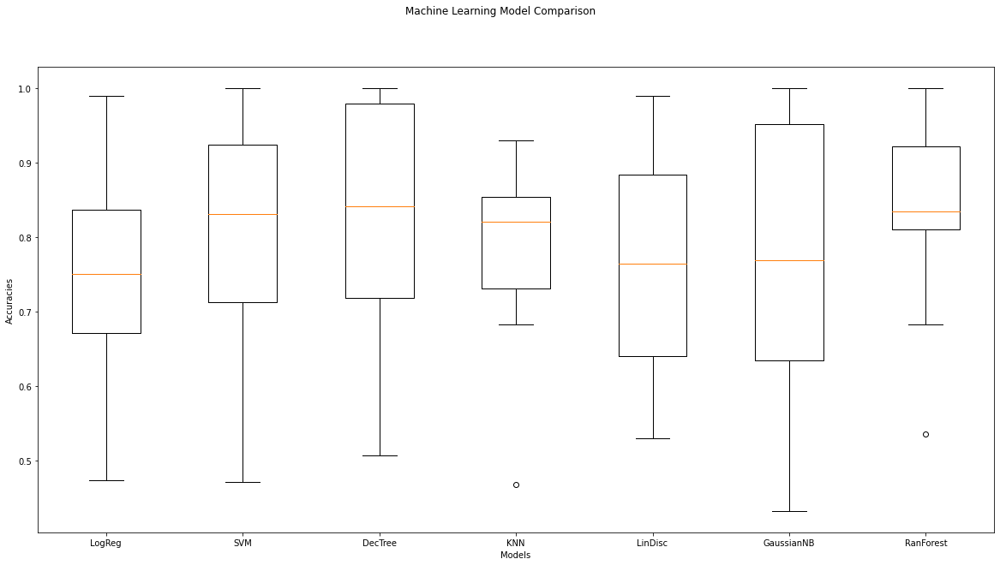

In [14]:
fig = plt.figure()
fig.suptitle('Machine Learning Model Comparison')
ax = fig.add_subplot(111)
plt.boxplot(outcome)
plt.xlabel('Models')
plt.ylabel('Accuracies')
ax.set_xticklabels(model_names)
plt.show()

In [15]:
import numpy as nump

uniqueValues, occurCount = nump.unique(Y, return_counts=True)
 
print("Unique Values : " , uniqueValues)
print("Occurrence Count : ", occurCount)

Unique Values :  [0. 1. 2.]
Occurrence Count :  [11928 11928 11928]


In [16]:
Y

array([1., 1., 1., ..., 2., 2., 2.])

In [17]:
import numpy as nump
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
enc = OneHotEncoder()
Y = enc.fit_transform(Y[:, nump.newaxis]).toarray()

In [18]:
X

,0,1,2,3,4,5
0,0.0,0.340102,0.000000,0.000000,0.607843,0.392157
1,0.0,0.340102,0.069024,0.035197,0.607843,0.392157
2,0.0,0.340102,0.117665,0.154911,0.607843,0.392157
3,0.0,0.340102,0.118844,0.296102,0.607843,0.392157
4,0.0,0.340102,0.140010,0.456232,0.607843,0.392157
...,...,...,...,...,...,...
35779,1.0,0.700508,1.000000,0.288090,0.627451,0.372549
35780,1.0,0.700508,0.787060,0.634561,0.627451,0.372549
35781,1.0,0.700508,0.344159,0.603983,0.627451,0.372549
35782,1.0,0.700508,0.364637,1.000000,0.627451,0.372549


In [51]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.33, random_state=2)

In [52]:
n_features = X.shape[1]
n_classes = Y.shape[1]

In [53]:
import sklearn 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

In [54]:
dt = DecisionTreeClassifier()
dt.fit(X_train, Y_train)

DecisionTreeClassifier()

In [55]:
y_pred = dt.predict(X_test)

In [56]:
from sklearn.metrics import classification_report

print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3911
           1       1.00      1.00      1.00      3929
           2       1.00      1.00      1.00      3969

   micro avg       1.00      1.00      1.00     11809
   macro avg       1.00      1.00      1.00     11809
weighted avg       1.00      1.00      1.00     11809
 samples avg       1.00      1.00      1.00     11809



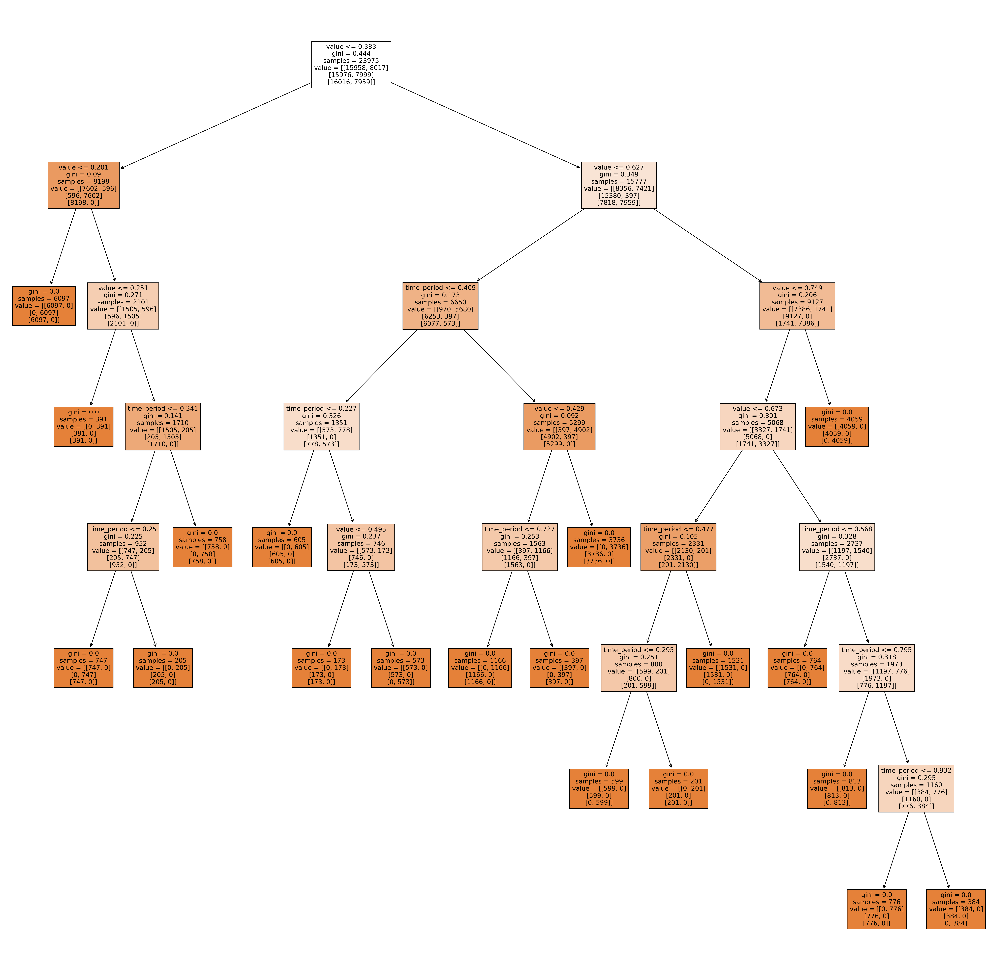

In [57]:
#!pip install -q graphviz
import graphviz
from matplotlib import pyplot as plt
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier 
from sklearn import tree

fn=["time_period","value","lowci","highci","age","case_rate","hospitalized_rate","death_rate","case_count","hospitalized_count","death_count","twitter_count"]
cn=['Anxiety', 'Depression', 'Anxiety or Depression']

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=300)
tree.plot_tree(dt,
               feature_names = fn, 
               class_names=cn,
               filled = True);

In [58]:
from sklearn.metrics import accuracy_score
score = accuracy_score(Y_test, y_pred)
score

1.0

In [59]:
n_features

6

In [60]:
n_classes

3

In [61]:
n_features = X.shape[1]
n_classes = Y.shape[1]

In [62]:
n_features

6

In [63]:
ny

,time_period,value,CASE_RATE,HOSPITALIZED_RATE,sentiment__negative,sentiment__positive,indicator
0,1.0,28.7,171.46,13.55,500.0,50.0,1.0
1,1.0,28.7,1554.45,153.69,500.0,50.0,1.0
2,1.0,28.7,2529.03,630.34,500.0,50.0,1.0
3,1.0,28.7,2552.64,1192.50,500.0,50.0,1.0
4,1.0,28.7,2976.74,1830.07,500.0,50.0,1.0
...,...,...,...,...,...,...,...
35779,23.0,35.8,20207.72,1160.60,501.0,49.0,2.0
35780,23.0,35.8,15941.19,2540.10,501.0,49.0,2.0
35781,23.0,35.8,7067.11,2418.35,501.0,49.0,2.0
35782,23.0,35.8,7477.43,3995.12,501.0,49.0,2.0


In [64]:
data2 = pd.read_csv('./new_york.csv')
#data2["indicator"].replace({"Symptoms of Anxiety Disorder": "1", "Symptoms of Depressive Disorder": "2", "Symptoms of Anxiety Disorder or Depressive Disorder": "3"}, inplace=True)
#data2["age"].replace({"18 - 29 years": "29", "30 - 39 years": "39", "40 - 49 years": "49", "50 - 59 years":"59","60 - 69 years":"69","70 - 79 years":"79","80 years and above":"80"}, inplace=True)

del data2['group']
del data2['state']
del data2['subgroup']
del data2['time_period_label']
del data2['confidence_interval']
del data2['quartile_range']

data2['DEATH_RATE'].fillna((data2['DEATH_RATE'].mean()), inplace=True)
data2.loc[data2['phase'] == ('Oct 28 � Dec 21'), 'phase'] = 3
data2.loc[data2['phase'] == ('3 (Oct 28 � Dec 21)'), 'phase'] = 4
data2.loc[data2['phase'] == ('3 (Jan 6 � Feb 1)'), 'phase'] = 5
data2.rename(columns = {'counts':'twitter_count'}, inplace = True)

In [37]:
from sklearn import preprocessing

#data2["age"] = data2['age'].astype(float)
#data2["indicator"] = data2['indicator'].astype(float)
data2["phase"] = data2['phase'].astype(float)
#data2["indicator"] = data2['indicator'].astype(float)
data2["time_period"] = data2['time_period'].astype(float)


data2

,indicator,phase,time_period,time_period_start_date,time_period_end_date,value,lowci,highci,age,CASE_RATE,HOSPITALIZED_RATE,DEATH_RATE,date,CASE_COUNT,HOSPITALIZED_COUNT,DEATH_COUNT,twitter_count,sentiment__negative,sentiment__positive
0,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,171.46,13.55,0.23,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
1,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,1554.45,153.69,12.88,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
2,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,2529.03,630.34,113.37,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
3,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,2552.64,1192.50,364.17,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
4,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,2976.74,1830.07,909.18,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35779,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,20207.72,1160.60,67.68,2021-02-01,224684.00000,13326.000000,794.000000,419169.0,501.0,49.0
35780,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,15941.19,2540.10,476.51,2021-02-01,161559.00000,25652.000000,4800.000000,419169.0,501.0,49.0
35781,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,7067.11,2418.35,756.82,2021-02-01,50798.00000,17383.000000,5440.000000,419169.0,501.0,49.0
35782,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,7477.43,3995.12,1989.81,2021-02-01,41994.00000,22437.000000,11175.000000,419169.0,501.0,49.0


In [38]:
data2["indicator"].value_counts()

Symptoms of Anxiety Disorder or Depressive Disorder    11928
Symptoms of Depressive Disorder                        11928
Symptoms of Anxiety Disorder                           11928
Name: indicator, dtype: int64

In [39]:
#Consider removing cell
"""def min_max_normalization(df):
    # copy the dataframe
    df_norm = df.copy()
    # apply min-max scaling
    for column in df_norm.columns:
        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        
    return df_norm

data2 = min_max_normalization(data2)"""

'def min_max_normalization(df):\n    # copy the dataframe\n    df_norm = df.copy()\n    # apply min-max scaling\n    for column in df_norm.columns:\n        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())\n        \n    return df_norm\n\ndata2 = min_max_normalization(data2)'

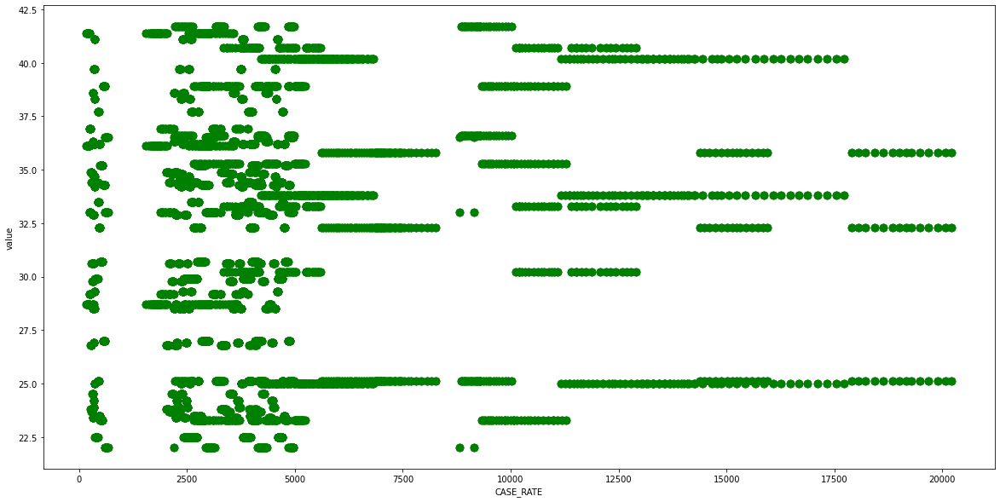

In [40]:
data2.plot(kind="scatter", x="CASE_RATE", y="value", color="green",s=70)
plt.show()

In [41]:
import pandas as pd
#!pip install seaborn
# To ignore warnings, use the following code to make the display more attractive.
# Import seaborn and matplotlib.
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="white", color_codes=True)

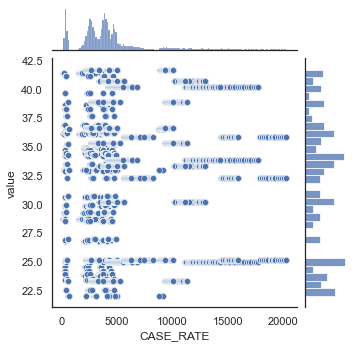

In [42]:
sns.jointplot(x="CASE_RATE", y="value", data=data2, size=5)
plt.show()

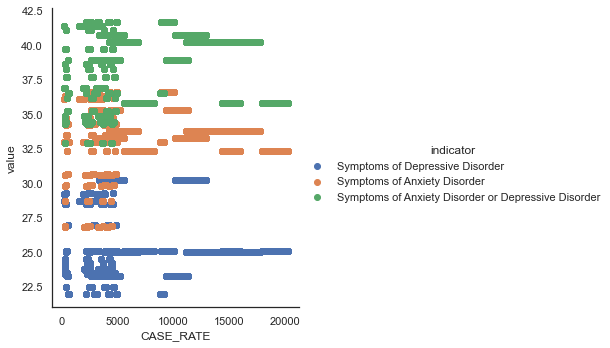

In [43]:
sns.FacetGrid(data2, hue="indicator", size=5) \
   .map(plt.scatter, "CASE_RATE", "value") \
   .add_legend()
plt.show()

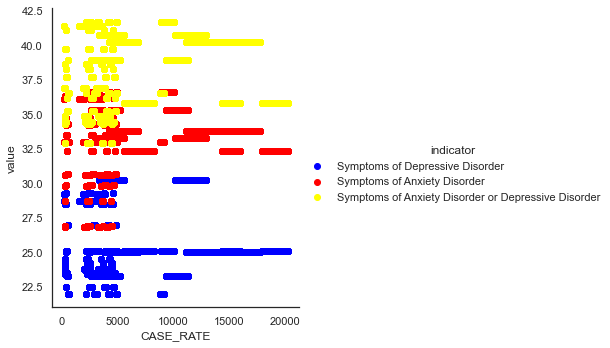

In [44]:
# Change the colors of the data points in the graph above
# Assign the colors a variable name, and insert hue_kws="variable name" as shown.
KS = {'color': ['blue', 'red', 'yellow', 'Green', 'Orange']}
sns.FacetGrid(data2, hue_kws=KS, hue="indicator", size=5) \
   .map(plt.scatter, "CASE_RATE", "value") \
   .add_legend()
plt.show()

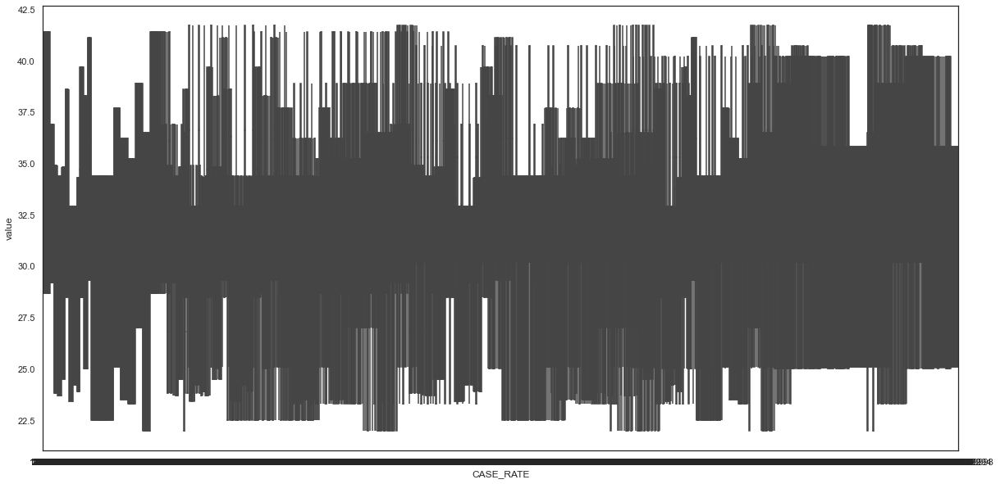

In [45]:
sns.boxplot(x="CASE_RATE", y="value", data=data2 )
plt.show()

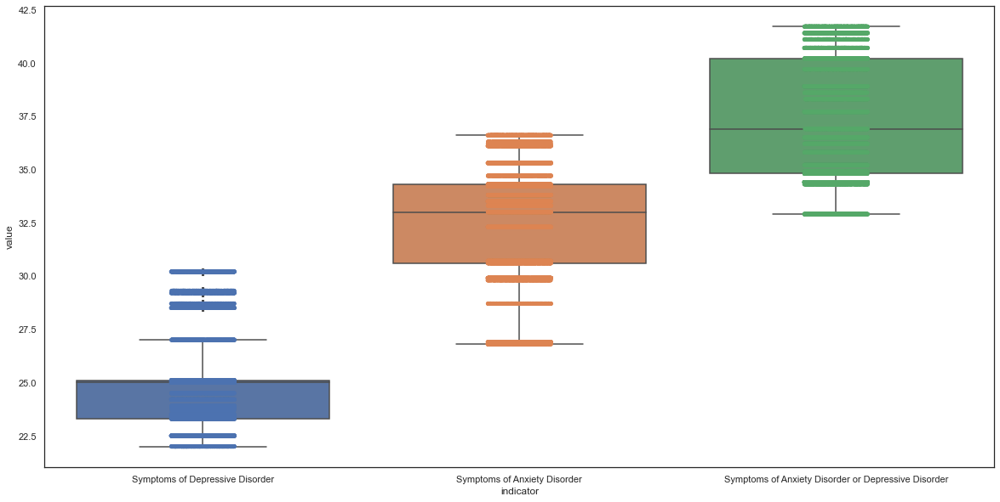

In [46]:
# Use Seaborn's striplot to add data points on top of the box plot 
# Insert jitter=True so that the data points remain scattered and not piled into a verticle line.
# Assign ax to each axis, so that each plot is ontop of the previous axis. 

ax= sns.boxplot(x="indicator", y="value", data=data2)
ax= sns.stripplot(x="indicator", y="value", data=data2, jitter=True, edgecolor="gray")
plt.show()

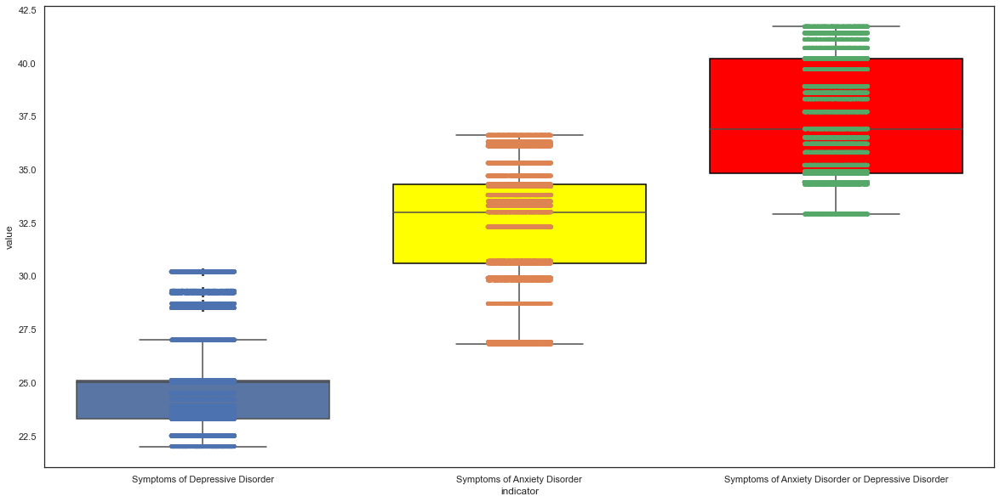

In [47]:
# Tweek the plot above to change fill and border color color using ax.artists.
# Assing ax.artists a variable name, and insert the box number into the corresponding brackets

ax= sns.boxplot(x="indicator", y="value", data=data2)
ax= sns.stripplot(x="indicator", y="value", data=data2, jitter=True, edgecolor="gray")

boxtwo = ax.artists[2]
boxtwo.set_facecolor('red')
boxtwo.set_edgecolor('black')
boxthree=ax.artists[1]
boxthree.set_facecolor('yellow')
boxthree.set_edgecolor('black')

plt.show()

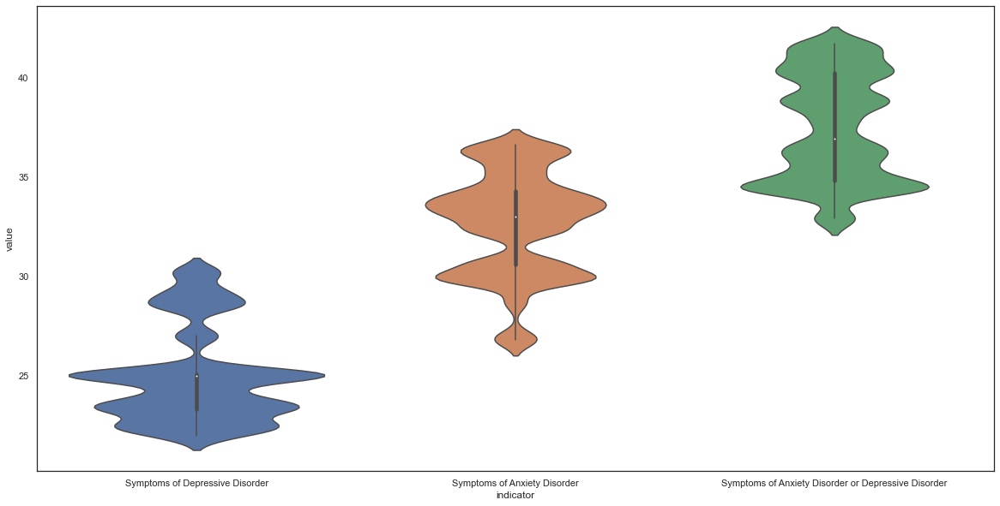

In [48]:
# A violin plot shows the density of the data, simularly to a scatter plot,
#and presents catagorical data like a box plot.
# Denser regions of the data are fatter.
sns.violinplot(x="indicator", y="value", data=data2, size=6)
plt.show()

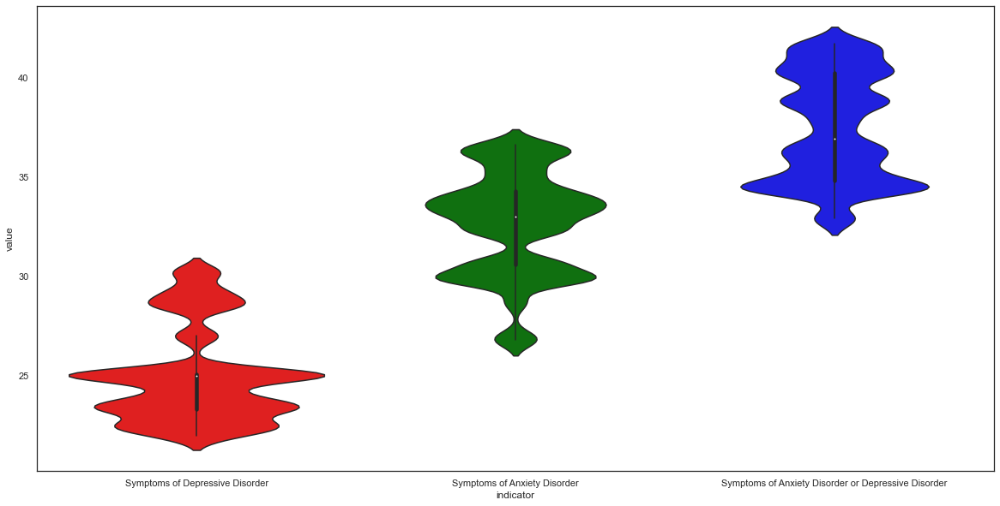

In [49]:
sns.violinplot(x="indicator", y="value",  palette={"blue","red","yellow", "Green", "Orange"}, data=data2, size=6)
plt.show()

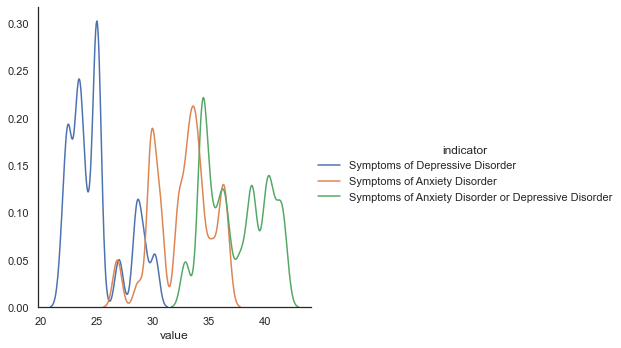

In [50]:
# seaborn's kdeplot, plots univariate or bivariate density estimates.
#Size can be changed by tweeking the value used
sns.FacetGrid(data2, hue="indicator", size=5) \
   .map(sns.kdeplot, "value") \
   .add_legend()
plt.show()

In [51]:
data2

,indicator,phase,time_period,time_period_start_date,time_period_end_date,value,lowci,highci,age,CASE_RATE,HOSPITALIZED_RATE,DEATH_RATE,date,CASE_COUNT,HOSPITALIZED_COUNT,DEATH_COUNT,twitter_count,sentiment__negative,sentiment__positive
0,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,171.46,13.55,0.23,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
1,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,1554.45,153.69,12.88,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
2,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,2529.03,630.34,113.37,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
3,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,2552.64,1192.50,364.17,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
4,Symptoms of Depressive Disorder,1.0,1.0,2020-04-23T00:00:00.000,2020-05-05T00:00:00.000,28.7,24.6,33.1,18 - 29 years,2976.74,1830.07,909.18,2020-04-23,90629.21686,19942.175032,6754.809134,295066.0,500.0,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35779,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,20207.72,1160.60,67.68,2021-02-01,224684.00000,13326.000000,794.000000,419169.0,501.0,49.0
35780,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,15941.19,2540.10,476.51,2021-02-01,161559.00000,25652.000000,4800.000000,419169.0,501.0,49.0
35781,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,7067.11,2418.35,756.82,2021-02-01,50798.00000,17383.000000,5440.000000,419169.0,501.0,49.0
35782,Symptoms of Anxiety Disorder or Depressive Dis...,5.0,23.0,2021-01-20T00:00:00.000,2021-02-01T00:00:00.000,35.8,32.0,39.7,80 years and above,7477.43,3995.12,1989.81,2021-02-01,41994.00000,22437.000000,11175.000000,419169.0,501.0,49.0


<Figure size 2160x2160 with 0 Axes>

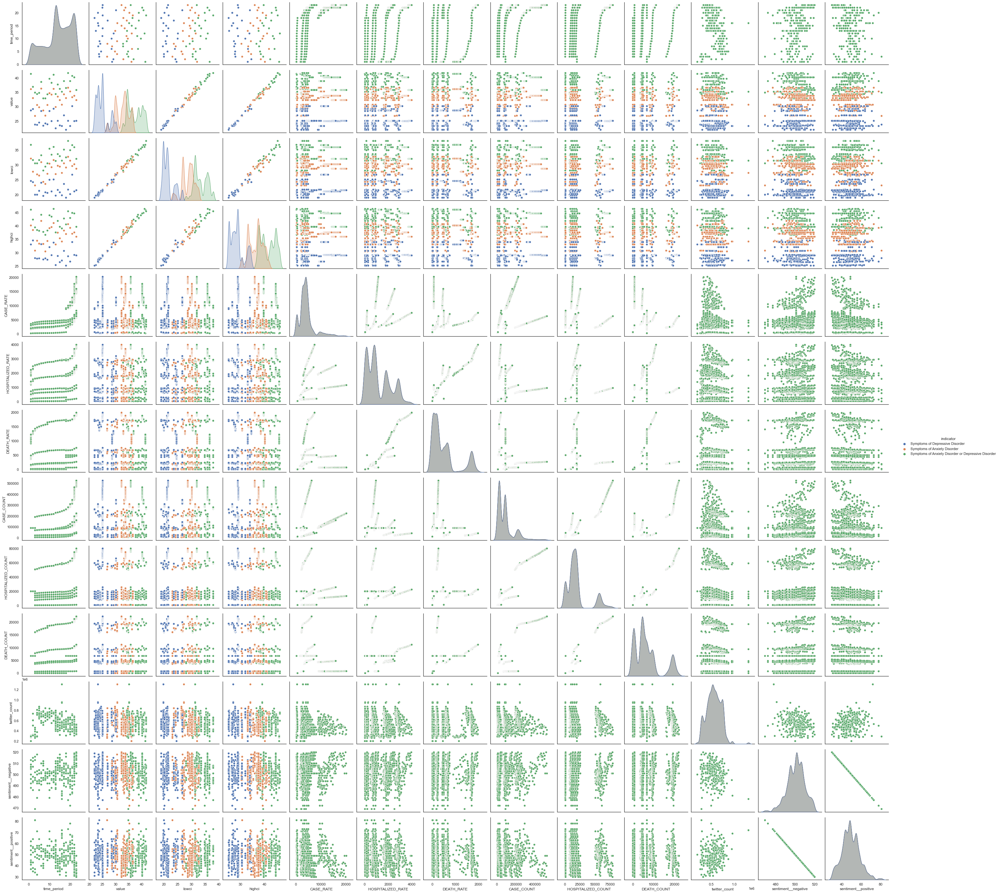

In [52]:
plt.figure(figsize=(30,30))
sns.pairplot(data2.drop("phase", axis=1), hue="indicator", size=3)
plt.show()

<Figure size 1440x720 with 0 Axes>

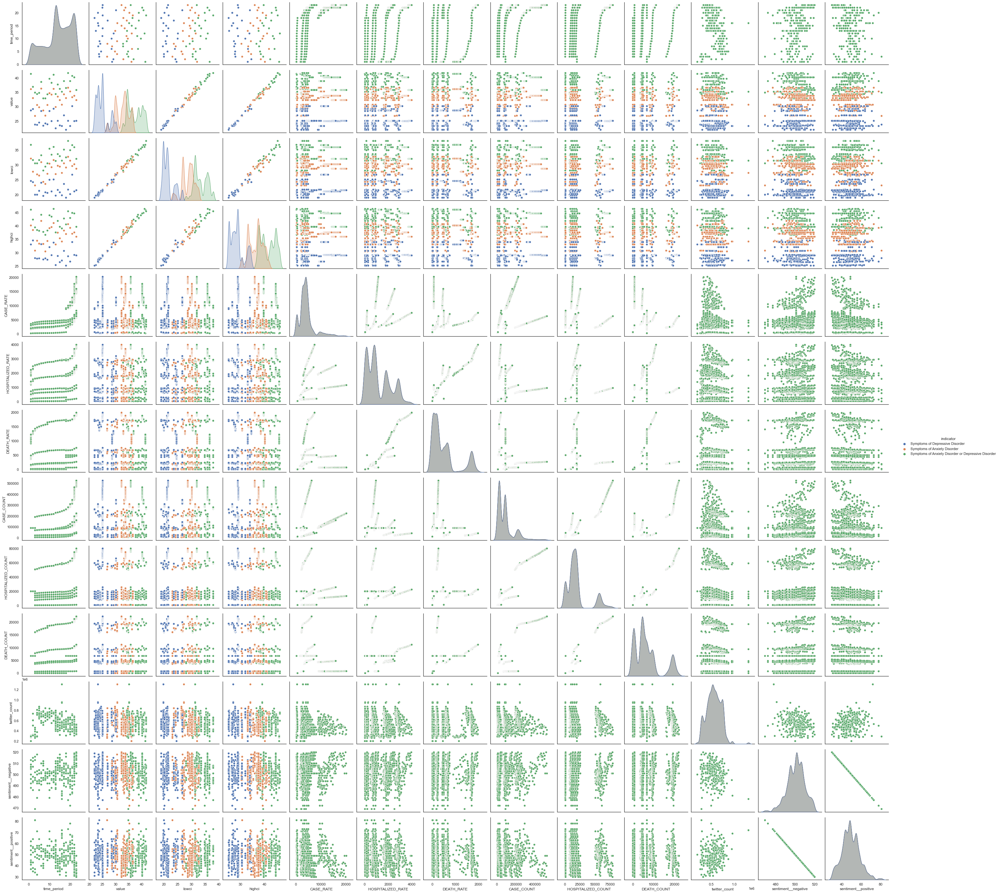

In [53]:
plt.figure(figsize=(20,10))
sns.pairplot(data2.drop("phase", axis=1), hue="indicator", size=3, diag_kind="kde")
plt.show()

In [54]:
"""# Use seaborn's jointplot to make a hexagonal bin plot
#Set desired size and ratio and choose a color.

#MIGHT NEED TO NORMALIZE HERE
data2["indicator"] = data2['indicator'].astype(float)
data2["indicator"].replace({"Symptoms of Anxiety Disorder": "1", "Symptoms of Depressive Disorder": "2", "Symptoms of Anxiety Disorder or Depressive Disorder": "3"}, inplace=True)
data2["age"].replace({"18 - 29 years": "29", "30 - 39 years": "39", "40 - 49 years": "49", "50 - 59 years":"59","60 - 69 years":"69","70 - 79 years":"79","80 years and above":"80"}, inplace=True)
data2["age"] = data2['age'].astype(float)
data2["indicator"] = data2['indicator'].astype(float)

def min_max_normalization(df):
    # copy the dataframe
    df_norm = df.copy()
    # apply min-max scaling
    for column in df_norm.columns:
        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        
    return df_norm

data2 = min_max_normalization(data2)

sns.jointplot(x="value", y="twitter_count", data=data2, size=10,ratio=10, kind='hex',color='green')
plt.show()"""

'# Use seaborn\'s jointplot to make a hexagonal bin plot\n#Set desired size and ratio and choose a color.\n\n#MIGHT NEED TO NORMALIZE HERE\ndata2["indicator"] = data2[\'indicator\'].astype(float)\ndata2["indicator"].replace({"Symptoms of Anxiety Disorder": "1", "Symptoms of Depressive Disorder": "2", "Symptoms of Anxiety Disorder or Depressive Disorder": "3"}, inplace=True)\ndata2["age"].replace({"18 - 29 years": "29", "30 - 39 years": "39", "40 - 49 years": "49", "50 - 59 years":"59","60 - 69 years":"69","70 - 79 years":"79","80 years and above":"80"}, inplace=True)\ndata2["age"] = data2[\'age\'].astype(float)\ndata2["indicator"] = data2[\'indicator\'].astype(float)\n\ndef min_max_normalization(df):\n    # copy the dataframe\n    df_norm = df.copy()\n    # apply min-max scaling\n    for column in df_norm.columns:\n        df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())\n        \n    return df_norm\n\ndata2 = min_max_normal

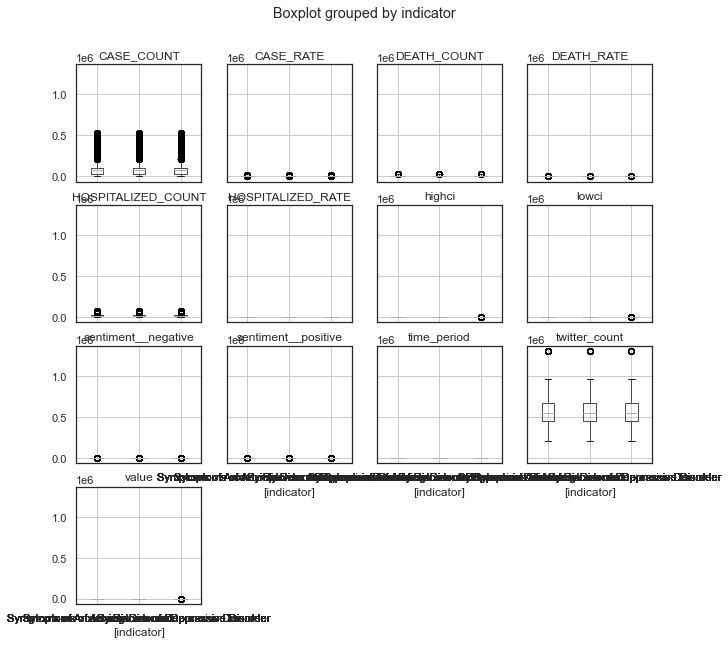

In [55]:
# To make a Pandas boxplot grouped by species, use .boxplot
#Modify the figsize, by placing a value in the X and Y cordinates
data2.drop("phase", axis=1).boxplot(by="indicator", figsize=(10, 10))
plt.show()

In [65]:
# In order to ignore FutureWarning
#!pip install tensorflow
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

def create_custom_model(input_dim, output_dim, nodes, n=1, name='model'):
    def create_model():
        # Create model
        model = Sequential(name=name)
        for i in range(n):
            model.add(Dense(nodes, input_dim=input_dim, activation='relu'))
        model.add(Dense(output_dim, activation='softmax'))

        # Compile model
        model.compile(loss='categorical_crossentropy', 
                      optimizer='adam', 
                      metrics=['accuracy'])
        return model
    return create_model

models = [create_custom_model(n_features, n_classes, 6, i, 'model_{}'.format(i)) 
          for i in range(1, 4)]

for create_model in models:
    create_model().summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_65 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_66 (Dense)             (None, 3)                 21        
Total params: 63
Trainable params: 63
Non-trainable params: 0
_________________________________________________________________
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_67 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_68 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_69 (Dense)             (None, 3)                 21        
Total params: 105
Trainable params: 105
Non-tr

In [66]:
X_train.shape

(23975, 6)

In [67]:
from tensorflow.keras.callbacks import TensorBoard

history_dict = {}

# TensorBoard Callback
cb = TensorBoard()

for create_model in models:
    model = create_model()
    print('Model name:', model.name)
    history_callback = model.fit(X_train, Y_train,
                                 #Original Batch Size was 5. Need to change to a bigger value
                                 batch_size=256,
                                 epochs=68,
                                 verbose=0,
                                 validation_data=(X_test, Y_test),
                                 callbacks=[cb])
    score = model.evaluate(X_test, Y_test, verbose=0)
    print('Test loss:', score[0])
    print('Test accuracy:', score[1])
    
    history_dict[model.name] = [history_callback, model]

Model name: model_1
Test loss: 0.3207794040938681
Test accuracy: 0.8311457363028198
Model name: model_2
Test loss: 0.2585969111898002
Test accuracy: 0.8653569311542044
Model name: model_3
Test loss: 0.25180282072841653
Test accuracy: 0.8783978321619104


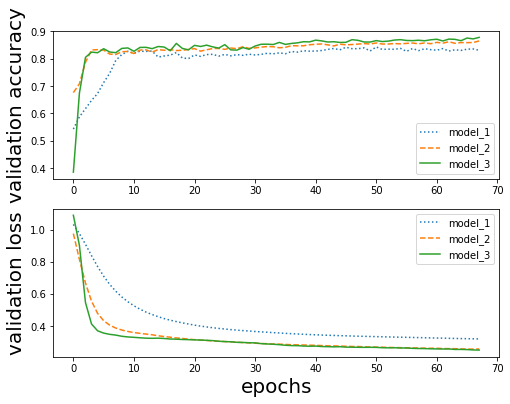

In [68]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(8, 6))

for model_name in history_dict:
    val_acc = history_dict[model_name][0].history['val_accuracy']
    val_loss = history_dict[model_name][0].history['val_loss']
    if(model_name in "model_1"):
        ax1.plot(val_acc, label=model_name, linestyle='dotted')
        ax2.plot(val_loss, label=model_name, linestyle='dotted')
    if(model_name in "model_2"):
        ax1.plot(val_acc, label=model_name, linestyle='dashed')
        ax2.plot(val_loss, label=model_name, linestyle='dashed')
    if(model_name in "model_3"):
        ax1.plot(val_acc, label=model_name, linestyle='solid')
        ax2.plot(val_loss, label=model_name, linestyle='solid')
    
ax1.set_ylabel('validation accuracy', fontsize=20)
ax2.set_ylabel('validation loss', fontsize=20)
ax2.set_xlabel('epochs', fontsize=20)
ax1.legend()
ax2.legend()
plt.show()

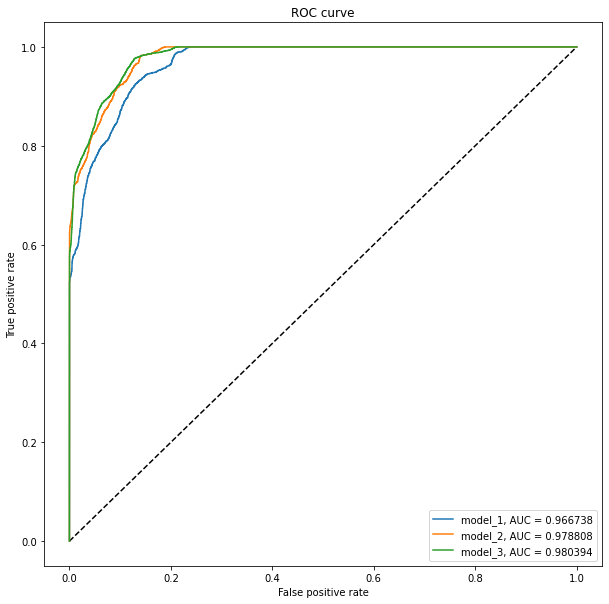

In [69]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))
plt.plot([0, 1], [0, 1], 'k--')

for model_name in history_dict:
    model = history_dict[model_name][1]
    
    Y_pred = model.predict(X_test)
    fpr, tpr, threshold = roc_curve(Y_test.ravel(), Y_pred.ravel())
    
    plt.plot(fpr, tpr, label='{}, AUC = {:.6f}'.format(model_name, auc(fpr, tpr)))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend();

In [70]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score

create_model = create_custom_model(n_features, n_classes, 6, 3)

estimator = KerasClassifier(build_fn=create_model, epochs=68, batch_size=256, verbose=0)
scores = cross_val_score(estimator, X_train, Y_train, cv=10)
print("Accuracy : {:0.2f} (+/- {:0.2f})".format(scores.mean(), scores.std()))

Accuracy : 0.88 (+/- 0.02)


In [71]:
checker = create_model()

In [72]:
checker.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_123 (Dense)            (None, 6)                 42        
_________________________________________________________________
dense_124 (Dense)            (None, 6)                 42        
_________________________________________________________________
dense_125 (Dense)            (None, 6)                 42        
_________________________________________________________________
dense_126 (Dense)            (None, 3)                 21        
Total params: 147
Trainable params: 147
Non-trainable params: 0
_________________________________________________________________


In [73]:
X_test

,0,1,2,3,4,5
19462,0.636364,0.076142,0.229340,0.724481,0.705882,0.294118
10403,0.500000,0.969543,0.120296,0.162652,0.666667,0.333333
17825,0.590909,0.157360,0.130281,0.168321,0.803922,0.196078
20194,0.681818,0.670051,0.230563,0.734354,0.313725,0.686275
34324,1.000000,0.700508,0.338235,0.945574,0.862745,0.137255
...,...,...,...,...,...,...
16073,0.545455,0.629442,0.127972,0.167208,0.745098,0.254902
8416,0.363636,0.436548,0.217204,0.688804,0.568627,0.431373
6017,0.227273,0.329949,0.113012,0.155989,0.803922,0.196078
32399,0.954545,0.923858,0.233560,0.207541,0.627451,0.372549


In [74]:
#!pip install ann_visualizer
from ann_visualizer.visualize import ann_viz

In [75]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, Activation;
import numpy
import tensorflow
tensorflow.keras.backend.set_floatx('float64')

# fix random seed for reproducibility
numpy.random.seed(7)
# load pima indians dataset
#dataset = numpy.loadtxt('/Users/yadavn/ATsCombined.csv', delimiter=",")
# split into input (X) and output (rflow.keY) variables
# create model
model = Sequential()
model.add(Dense(6,activation='relu'))
model.add(Dense(6, activation='relu'))
model.add(Dense(3, activation='softmax'))
# Compile model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# Fit the model
ann = model.fit(X_train, Y_train, epochs=68, batch_size=268)
# evaluate the model
scores = model.evaluate(X_test, Y_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

Epoch 1/68
90/90 [==============================] - 0s 2ms/step - loss: 1.0866 - accuracy: 0.3653
Epoch 2/68
90/90 [==============================] - 0s 2ms/step - loss: 1.0216 - accuracy: 0.4532
Epoch 3/68
90/90 [==============================] - 0s 2ms/step - loss: 0.9439 - accuracy: 0.6255
Epoch 4/68
90/90 [==============================] - 0s 2ms/step - loss: 0.8320 - accuracy: 0.6574
Epoch 5/68
90/90 [==============================] - 0s 2ms/step - loss: 0.7209 - accuracy: 0.6945
Epoch 6/68
90/90 [==============================] - 0s 2ms/step - loss: 0.6287 - accuracy: 0.7609
Epoch 7/68
90/90 [==============================] - 0s 2ms/step - loss: 0.5574 - accuracy: 0.8215
Epoch 8/68
90/90 [==============================] - 0s 2ms/step - loss: 0.5009 - accuracy: 0.8280
Epoch 9/68
90/90 [==============================] - 0s 2ms/step - loss: 0.4529 - accuracy: 0.8302
Epoch 10/68
90/90 [==============================] - 0s 2ms/step - loss: 0.4203 - accuracy: 0.8251
Epoch 11/68
90/90 [

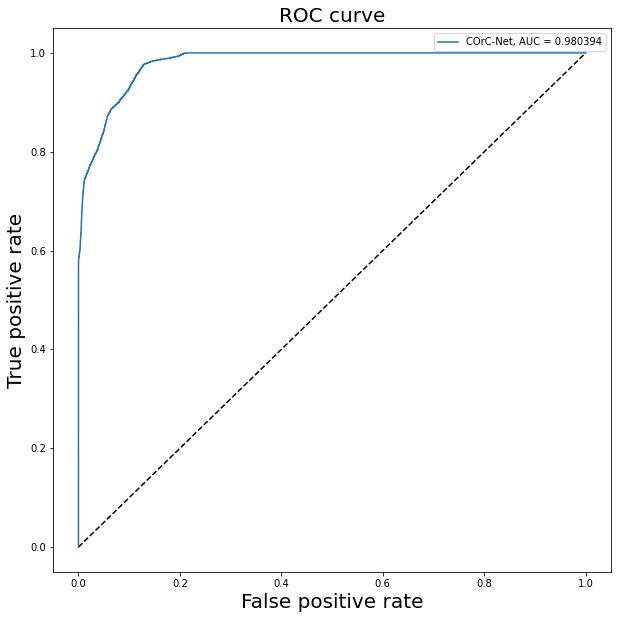

In [76]:
from sklearn.metrics import roc_curve, auc

plt.figure(figsize=(10, 10))
plt.plot([0, 1], [0, 1], 'k--')

for model_name in history_dict:
    model = history_dict[model_name][1]
    Y_pred = model.predict(X_test)
    fpr, tpr, threshold = roc_curve(Y_test.ravel(), Y_pred.ravel())
    
plt.plot(fpr, tpr, label='{}, AUC = {:.6f}'.format("COrC-Net", auc(fpr, tpr), fontsize=30))   
plt.xlabel('False positive rate', fontsize=20)
plt.ylabel('True positive rate', fontsize=20)
plt.title('ROC curve', fontsize=20)
plt.legend();

In [44]:
"""# define one new instance
Xnew = [[0.70, 0.75, 0.09, .75, .95, .155, .3, .25, .35, .66, .97, .12]]
# make a prediction
# define one new instance
#Xnew = [[0.70, 1.75, 0.0, .25, .155, .155, 1, .25, .35, .66, .97, .88]]
# make a prediction showing all possible probabilities across the classses
ynew = checker.predict(Xnew)
print("X=%s, Predicted=%s" % (Xnew[0], ynew[0]))
# Predict the final class
ynew = checker.predict_classes(Xnew)
print("X=%s, Predicted=%s" % (Xnew[0], ynew[0]))"""

'# define one new instance\nXnew = [[0.70, 0.75, 0.09, .75, .95, .155, .3, .25, .35, .66, .97, .12]]\n# make a prediction\n# define one new instance\n#Xnew = [[0.70, 1.75, 0.0, .25, .155, .155, 1, .25, .35, .66, .97, .88]]\n# make a prediction showing all possible probabilities across the classses\nynew = checker.predict(Xnew)\nprint("X=%s, Predicted=%s" % (Xnew[0], ynew[0]))\n# Predict the final class\nynew = checker.predict_classes(Xnew)\nprint("X=%s, Predicted=%s" % (Xnew[0], ynew[0]))'

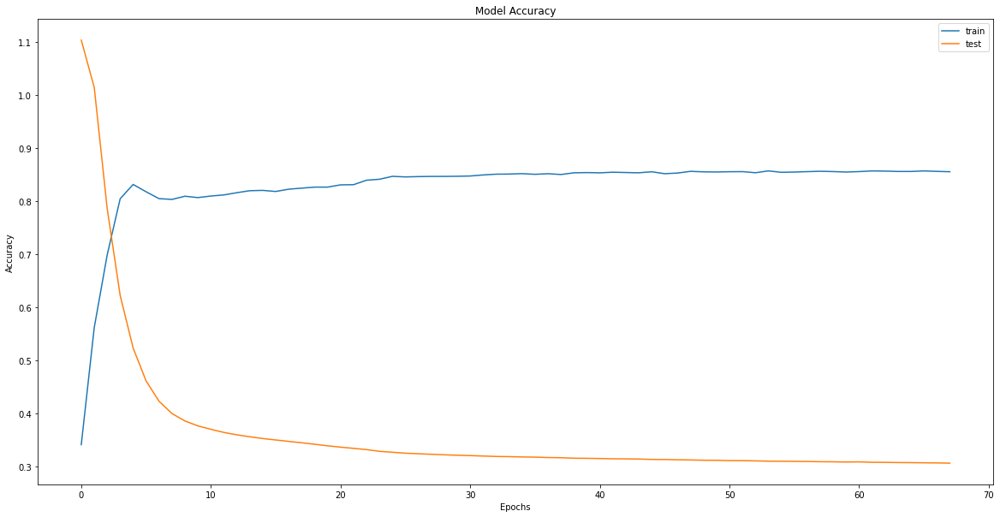

In [45]:
plt.plot(ann.history['accuracy'])
plt.plot(ann.history['loss'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

In [46]:
import numpy as np
pred=model.predict(X_test)
pred_digits=np.argmax(pred,axis=1)
y_train_ad = np.argmax(Y_train, axis=1)

In [47]:
from sklearn.metrics import classification_report
print(classification_report(Y_test, pred.round()))

              precision    recall  f1-score   support

           0       0.83      0.72      0.77      3580
           1       0.93      0.90      0.91      3571
           2       0.82      0.95      0.88      3585

   micro avg       0.86      0.86      0.86     10736
   macro avg       0.86      0.86      0.86     10736
weighted avg       0.86      0.86      0.86     10736
 samples avg       0.86      0.86      0.86     10736



In [48]:
(Y_test == pred)

array([[False, False, False],
       [False, False, False],
       [False, False, False],
       ...,
       [False, False, False],
       [False, False, False],
       [False, False, False]])

In [49]:
from sklearn.metrics import confusion_matrix
confusion_matrix(Y_test.argmax(axis=1), pred.round().argmax(axis=1))

array([[2579,  257,  744],
       [ 344, 3227,    0],
       [ 167,    0, 3418]], dtype=int64)

In [50]:
from scipy.stats import chi2_contingency

import numpy as np
from scipy.stats import ttest_ind

res = ttest_ind(Y_test, pred)

print(res)

Ttest_indResult(statistic=array([-1.01080509,  0.99130839, -0.06138999]), pvalue=array([0.31212112, 0.32154619, 0.9510492 ]))
